### 安装配置环境

In [1]:
!pip install numpy pandas matplotlib requests tqdm opencv-python pillow gc -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
ERROR: Could not find a version that satisfies the requirement gc (from versions: none)
ERROR: No matching distribution found for gc


In [2]:
!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://download.pytorch.org/whl/cu113


#### 下载安装 mmcv-full

In [3]:
# 安装mmcv -full
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html
     |████████████████████████████████| 58.2 MB 12.5 MB/s eta 0:00:01    |████████████▏                   | 22.1 MB 6.4 MB/s eta 0:00:06     |██████████████████▎             | 33.3 MB 19.5 MB/s eta 0:00:02


#### 下载中文字体文件

In [4]:
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf


--2023-01-19 00:22:43--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 10050868 (9.6M) [application/x-font-ttf]
正在保存至: “SimHei.ttf”

SimHei.ttf          100%[===================>]   9.58M  21.8MB/s    用时 0.4s    

2023-01-19 00:22:44 (21.8 MB/s) - 已保存 “SimHei.ttf” [10050868/10050868])



#### 下载 ImageNet 1000类别信息

In [5]:
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/meta_data/imagenet_class_index.csv

--2023-01-19 00:23:01--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/meta_data/imagenet_class_index.csv
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 37074 (36K) [text/csv]
正在保存至: “imagenet_class_index.csv”

imagenet_class_inde 100%[===================>]  36.21K  --.-KB/s    用时 0.06s   

2023-01-19 00:23:01 (611 KB/s) - 已保存 “imagenet_class_index.csv” [37074/37074])



#### 创建目录

In [1]:
import os

In [7]:
# 存放测试图片
os.mkdir('test_img')

# 存放结果文件
os.mkdir('output')

In [8]:
# 下载测试图像文件 至 test_img 文件夹

!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/watermelon1.jpg -O test_img/watermelon1.jpg
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/banana1.jpg -O test_img/banana1.jpg
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/cat1.jpg -O test_img/cat1.jpg

# 哈士奇，来源：https://www.pexels.com/zh-cn/photo/2853130/
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/husky1.jpeg -O test_img/husky1.jpeg

# 猫狗，来源：https://unsplash.com/photos/ouo1hbizWwo
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/cat_dog.jpg -O test_img/cat_dog.jpg

!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/video_2.mp4 -O test_img/video_2.mp4

--2023-01-19 00:23:32--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/watermelon1.jpg
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 429666 (420K) [image/jpeg]
正在保存至: “test_img/watermelon1.jpg”

test_img/watermelon 100%[===================>] 419.60K  1.96MB/s    用时 0.2s    

2023-01-19 00:23:32 (1.96 MB/s) - 已保存 “test_img/watermelon1.jpg” [429666/429666])

--2023-01-19 00:23:32--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/banana1.jpg
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 463879 (453K) [image/jpeg]
正在保存至: “test_img/banana1.jpg”

test_img/banana1.jp 100%[===================>] 453.01K  1.89MB/s    用时 0.2s    

2023-01-19 00:23:33 (1.89 MB/s) - 已保存 “test_img/banana1.jpg” [463879/463879])

--2023-01-19 00:23:33--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/cat1.jpg
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 20

### ImageNet预训练图像分类模型预测单张图像

#### 设置matplotlib中文字体

In [9]:
# Linux操作系统，例如 云GPU平台：https://featurize.cn/?s=d7ce99f842414bfcaea5662a97581bd1
# 如果遇到 SSL 相关报错，重新运行本代码块即可
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf -O /environment/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/SimHei.ttf
!rm -rf /home/featurize/.cache/matplotlib

import matplotlib
matplotlib.rc("font",family='SimHei') # 中文字体

--2023-01-19 00:24:25--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 10050868 (9.6M) [application/x-font-ttf]
正在保存至: “/environment/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/SimHei.ttf”

/environment/minico 100%[===================>]   9.58M  22.1MB/s    用时 0.4s    

2023-01-19 00:24:26 (22.1 MB/s) - 已保存 “/environment/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/SimHei.ttf” [10050868/10050868])



#### 导入pillow中文字体

In [3]:
from PIL import ImageFont, ImageDraw
# 导入中文字体，指定字号
font = ImageFont.truetype('SimHei.ttf', 32)

#### 导入工具包

In [4]:
import os

import cv2
from PIL import Image, ImageFont, ImageDraw

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import torch
from torchvision import models
import torch.nn.functional as F
from torchvision import transforms

# 有 GPU 就用 GPU，没有就用 CPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cpu


In [18]:
dir(models)

['AlexNet',
 'DenseNet',
 'EfficientNet',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'Inception3',
 'InceptionOutputs',
 'MNASNet',
 'MobileNetV2',
 'MobileNetV3',
 'RegNet',
 'ResNet',
 'ShuffleNetV2',
 'SqueezeNet',
 'VGG',
 '_GoogLeNetOutputs',
 '_InceptionOutputs',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '_utils',
 'alexnet',
 'densenet',
 'densenet121',
 'densenet161',
 'densenet169',
 'densenet201',
 'detection',
 'efficientnet',
 'efficientnet_b0',
 'efficientnet_b1',
 'efficientnet_b2',
 'efficientnet_b3',
 'efficientnet_b4',
 'efficientnet_b5',
 'efficientnet_b6',
 'efficientnet_b7',
 'feature_extraction',
 'googlenet',
 'inception',
 'inception_v3',
 'mnasnet',
 'mnasnet0_5',
 'mnasnet0_75',
 'mnasnet1_0',
 'mnasnet1_3',
 'mobilenet',
 'mobilenet_v2',
 'mobilenet_v3_large',
 'mobilenet_v3_small',
 'mobilenetv2',
 'mobilenetv3',
 'quantization',
 'regnet',
 'regnet_x_16gf',
 'regnet_x_1_6gf',
 're

#### 预训练图像分类模型

In [5]:
# 载入预训练图像分类模型

model = models.resnet18(pretrained=True) 

# model = models.resnet152(pretrained=True)

model = model.eval()
model = model.to(device)

#### 载入ImageNet 1000图像分类中文标签

In [6]:
df = pd.read_csv('imagenet_class_index.csv')
idx_to_labels = {}
for idx, row in df.iterrows():
    idx_to_labels[row['ID']] = [row['wordnet'], row['Chinese']]

In [14]:
idx_to_labels

{0: ['n01440764', '丁鲷'],
 1: ['n01443537', '金鱼'],
 2: ['n01484850', '大白鲨'],
 3: ['n01491361', '虎鲨'],
 4: ['n01494475', '锤头鲨'],
 5: ['n01496331', '电鳐'],
 6: ['n01498041', '黄貂鱼'],
 7: ['n01514668', '公鸡'],
 8: ['n01514859', '母鸡'],
 9: ['n01518878', '鸵鸟'],
 10: ['n01530575', '燕雀'],
 11: ['n01531178', '金翅雀'],
 12: ['n01532829', '家朱雀'],
 13: ['n01534433', '灯芯草雀'],
 14: ['n01537544', '靛蓝雀,靛蓝鸟'],
 15: ['n01558993', '蓝鹀'],
 16: ['n01560419', '夜莺'],
 17: ['n01580077', '松鸦'],
 18: ['n01582220', '喜鹊'],
 19: ['n01592084', '山雀'],
 20: ['n01601694', '河鸟'],
 21: ['n01608432', '鸢（猛禽）'],
 22: ['n01614925', '秃头鹰'],
 23: ['n01616318', '秃鹫'],
 24: ['n01622779', '大灰猫头鹰'],
 25: ['n01629819', '欧洲火蝾螈'],
 26: ['n01630670', '普通蝾螈'],
 27: ['n01631663', '水蜥'],
 28: ['n01632458', '斑点蝾螈'],
 29: ['n01632777', '蝾螈,泥狗'],
 30: ['n01641577', '牛蛙'],
 31: ['n01644373', '树蛙'],
 32: ['n01644900', '尾蛙,铃蟾蜍,肋蟾蜍,尾蟾蜍'],
 33: ['n01664065', '红海龟'],
 34: ['n01665541', '皮革龟'],
 35: ['n01667114', '泥龟'],
 36: ['n01667778', '淡水龟'],
 37:

#### 图像预处理

In [7]:
# 测试集图像预处理-RCTN：缩放裁剪、转 Tensor、归一化
test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

#### 载入一张测试图像

In [16]:
# img_path = 'test_img/banana1.jpg'
img_path = 'test_img/husky1.jpeg'
# img_path = 'test_img/watermelon1.jpg'
# img_path = 'test_img/cat_dog.jpg'

img_pil = Image.open(img_path) # 用 pillow 载入

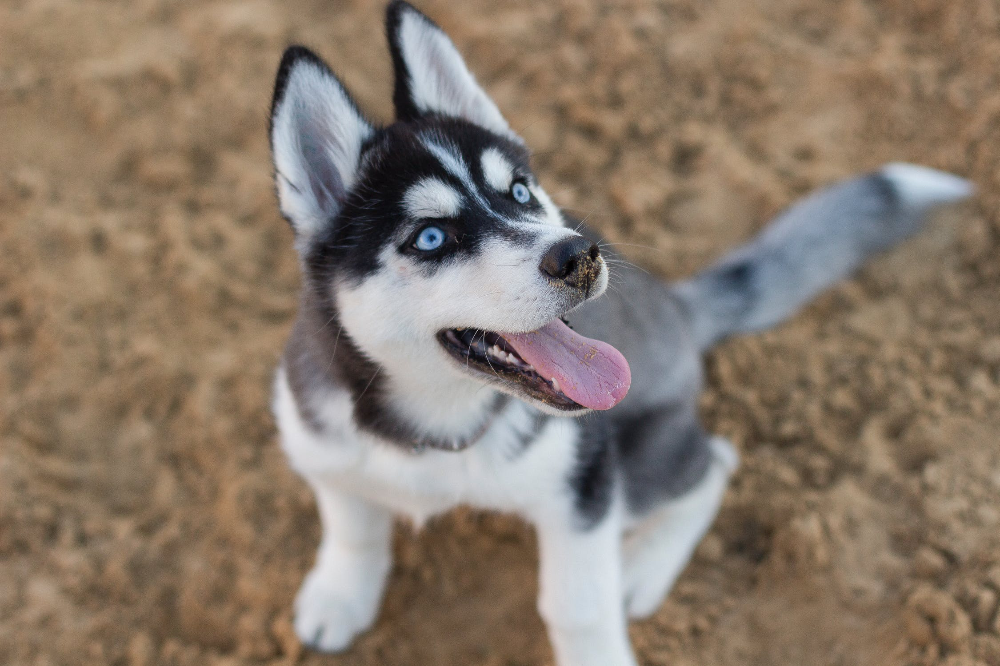

In [17]:
img_pil

#### 执行图像分类预测

In [19]:
input_img = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
pred_logits = model(input_img) # 执行前向预测，得到所有类别的 logit 预测分数
pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算

#### 各类别置信度柱状图

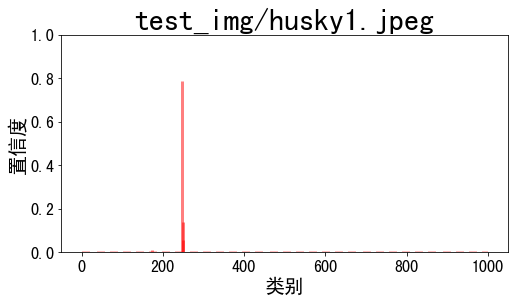

In [20]:
plt.figure(figsize=(8,4))

x = range(1000)
y = pred_softmax.cpu().detach().numpy()[0]

ax = plt.bar(x, y, alpha=0.5, width=0.3, color='yellow', edgecolor='red', lw=3)
plt.ylim([0, 1.0]) # y轴取值范围
# plt.bar_label(ax, fmt='%.2f', fontsize=15) # 置信度数值

plt.title(img_path, fontsize=30)
plt.xlabel('类别', fontsize=20)
plt.ylabel('置信度', fontsize=20)
plt.tick_params(labelsize=16) # 坐标文字大小

plt.show()

#### 取置信度最大的 n 个结果

In [21]:
n = 10
top_n = torch.topk(pred_softmax, n) # 取置信度最大的 n 个结果
pred_ids = top_n[1].cpu().detach().numpy().squeeze() # 解析出类别
confs = top_n[0].cpu().detach().numpy().squeeze() # 解析出置信度

#### 图像分类结果写在原图上

In [22]:
draw = ImageDraw.Draw(img_pil)

In [23]:
for i in range(n):
    class_name = idx_to_labels[pred_ids[i]][1] # 获取类别名称
    confidence = confs[i] * 100 # 获取置信度
    text = '{:<15} {:>.4f}'.format(class_name, confidence)
    print(text)
    
    # 文字坐标，中文字符串，字体，rgba颜色
    draw.text((50, 100 + 50 * i), text, font=font, fill=(255, 0, 0, 1))

爱斯基摩犬,哈士奇       78.7153
哈士奇             14.0684
雪橇犬,阿拉斯加爱斯基摩狗   5.7911
挪威猎犬            0.9031
威尔士柯基犬          0.2033
德国牧羊犬,德国警犬,阿尔萨斯 0.0970
凯尔皮犬            0.0507
彭布洛克威尔士科基犬      0.0444
灰狼              0.0237
边境牧羊犬           0.0230


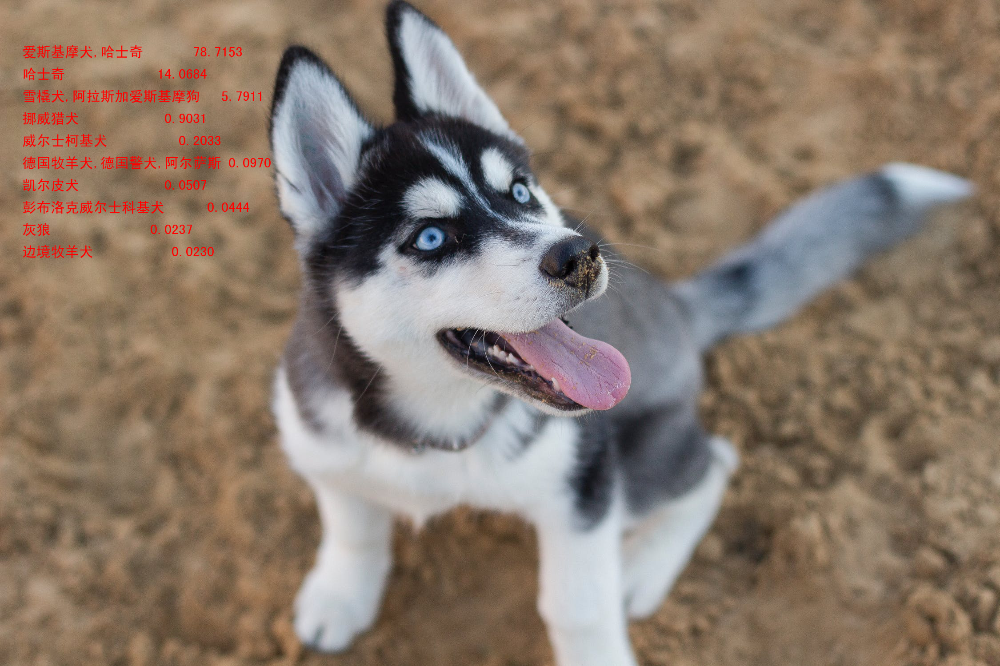

In [24]:
img_pil

In [25]:
# 保存图像
img_pil.save('output/img_pred.jpg')

#### 图像和柱状图一起显示

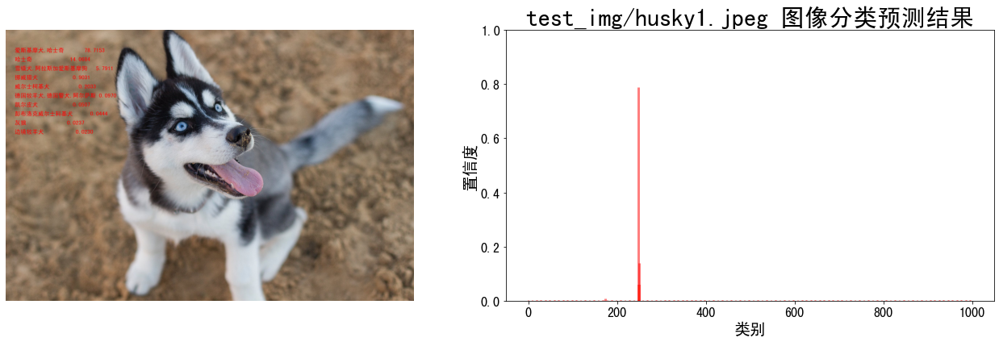

In [26]:
fig = plt.figure(figsize=(18,6))

# 绘制左图-预测图
ax1 = plt.subplot(1,2,1)
ax1.imshow(img_pil)
ax1.axis('off')

# 绘制右图-柱状图
ax2 = plt.subplot(1,2,2)
x = df['ID']
y = pred_softmax.cpu().detach().numpy()[0]
ax2.bar(x, y, alpha=0.5, width=0.3, color='yellow', edgecolor='red', lw=3)
plt.ylim([0, 1.0]) # y轴取值范围
plt.xlabel('类别', fontsize=20)
plt.ylabel('置信度', fontsize=20)
ax2.tick_params(labelsize=16) # 坐标文字大小

plt.title('{} 图像分类预测结果'.format(img_path), fontsize=30)

plt.tight_layout()
fig.savefig('output/预测图+柱状图.jpg')

#### 预测结果表格输出

In [27]:
pred_df = pd.DataFrame() # 预测结果表格
for i in range(n):
    class_name = idx_to_labels[pred_ids[i]][1] # 获取类别名称
    label_idx = int(pred_ids[i]) # 获取类别号
    wordnet = idx_to_labels[pred_ids[i]][0] # 获取 WordNet
    confidence = confs[i] * 100 # 获取置信度
    pred_df = pred_df.append({'Class':class_name, 'Class_ID':label_idx, 'Confidence(%)':confidence, 'WordNet':wordnet}, ignore_index=True) # 预测结果表格添加一行
display(pred_df) # 展示预测结果表格

,Class,Class_ID,Confidence(%),WordNet
0,"爱斯基摩犬,哈士奇",248.0,78.715348,n02109961
1,哈士奇,250.0,14.068352,n02110185
2,"雪橇犬,阿拉斯加爱斯基摩狗",249.0,5.791077,n02110063
3,挪威猎犬,174.0,0.903052,n02091467
4,威尔士柯基犬,264.0,0.203268,n02113186
5,"德国牧羊犬,德国警犬,阿尔萨斯",235.0,0.097040,n02106662
6,凯尔皮犬,227.0,0.050650,n02105412
7,彭布洛克威尔士科基犬,263.0,0.044381,n02113023
8,灰狼,269.0,0.023745,n02114367
9,边境牧羊犬,232.0,0.022999,n02106166


### ImageNet预训练图像分类模型预测视频文件

In [29]:
import os
import time
import shutil
import tempfile
from tqdm import tqdm

import cv2
from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['axes.unicode_minus']=False  # 用来正常显示负号
plt.rcParams['font.sans-serif']=['SimHei']  # 用来正常显示中文标签
import gc

import torch
import torch.nn.functional as F
from torchvision import models

import mmcv


# 有 GPU 就用 GPU，没有就用 CPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device:', device)

device: cuda:0


/environment/miniconda3/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


In [34]:
# 后端绘图，不显示，只保存
import matplotlib
matplotlib.use('Agg')

#### 图像分类预测函数

In [36]:
def pred_single_frame(img, n=5):
    '''
    输入摄像头画面bgr-array，输出前n个图像分类预测结果的图像bgr-array
    '''
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR 转 RGB
    img_pil = Image.fromarray(img_rgb) # array 转 pil
    input_img = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
    pred_logits = model(input_img) # 执行前向预测，得到所有类别的 logit 预测分数
    pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算

    top_n = torch.topk(pred_softmax, n) # 取置信度最大的 n 个结果
    pred_ids = top_n[1].cpu().detach().numpy().squeeze() # 解析出类别
    confs = top_n[0].cpu().detach().numpy().squeeze() # 解析出置信度

    # 在图像上写字
    draw = ImageDraw.Draw(img_pil)
    # 在图像上写字
    for i in range(len(confs)):
        pred_class = idx_to_labels[pred_ids[i]][1]
        text = '{:<15} {:>.3f}'.format(pred_class, confs[i])
        # 文字坐标，中文字符串，字体，rgba颜色
        draw.text((50, 100 + 50 * i), text, font=font, fill=(255, 0, 0, 1))

    img_bgr = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR) # RGB转BGR

    return img_bgr, pred_softmax

#### 输入输出视频路径

In [40]:
input_video = 'test_img/video_2.mp4'

#### 可视化方案一：原始图像+预测结果文字

In [41]:
# 创建临时文件夹，存放每帧结果
temp_out_dir = time.strftime('%Y%m%d%H%M%S')
os.mkdir(temp_out_dir)
print('创建文件夹 {} 用于存放每帧预测结果'.format(temp_out_dir))

创建文件夹 20230119003514 用于存放每帧预测结果


In [42]:
# 读入待预测视频
imgs = mmcv.VideoReader(input_video)

prog_bar = mmcv.ProgressBar(len(imgs))

# 对视频逐帧处理
for frame_id, img in enumerate(imgs):
    
    ## 处理单帧画面
    img, pred_softmax = pred_single_frame(img, n=5)

    # 将处理后的该帧画面图像文件，保存至 /tmp 目录下
    cv2.imwrite(f'{temp_out_dir}/{frame_id:06d}.jpg', img)
    
    prog_bar.update() # 更新进度条

# 把每一帧串成视频文件
mmcv.frames2video(temp_out_dir, 'output/output_pred.mp4', fps=imgs.fps, fourcc='mp4v')

shutil.rmtree(temp_out_dir) # 删除存放每帧画面的临时文件夹
print('删除临时文件夹', temp_out_dir)

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 730/730, 23.6 task/s, elapsed: 31s, ETA:     0s[                                                  ] 0/730, elapsed: 0s, ETA:
删除临时文件夹 20230119003514


#### 可视化方案二：原始图像+预测结果文字+各类别置信度柱状图

In [43]:
def pred_single_frame_bar(img):
    '''
    输入pred_single_frame函数输出的bgr-array，加柱状图，保存
    '''
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR 转 RGB
    fig = plt.figure(figsize=(18,6))
    # 绘制左图-视频图
    ax1 = plt.subplot(1,2,1)
    ax1.imshow(img)
    ax1.axis('off')
    # 绘制右图-柱状图
    ax2 = plt.subplot(1,2,2)
    x = range(1000)
    y = pred_softmax.cpu().detach().numpy()[0]
    ax2.bar(x, y, alpha=0.5, width=0.3, color='yellow', edgecolor='red', lw=3)
    plt.xlabel('类别', fontsize=20)
    plt.ylabel('置信度', fontsize=20)
    ax2.tick_params(labelsize=16) # 坐标文字大小
    plt.ylim([0, 1.0]) # y轴取值范围
    plt.xlabel('类别',fontsize=25)
    plt.ylabel('置信度',fontsize=25)
    plt.title('图像分类预测结果', fontsize=30)
    
    plt.tight_layout()
    fig.savefig(f'{temp_out_dir}/{frame_id:06d}.jpg')
    # 释放内存
    fig.clf()
    plt.close()
    gc.collect()

In [44]:
# 创建临时文件夹，存放每帧结果
temp_out_dir = time.strftime('%Y%m%d%H%M%S')
os.mkdir(temp_out_dir)
print('创建文件夹 {} 用于存放每帧预测结果'.format(temp_out_dir))

创建文件夹 20230119003650 用于存放每帧预测结果


In [45]:
# 读入待预测视频
imgs = mmcv.VideoReader(input_video)

prog_bar = mmcv.ProgressBar(len(imgs))

# 对视频逐帧处理
for frame_id, img in enumerate(imgs):

    ## 处理单帧画面
    img, pred_softmax = pred_single_frame(img, n=5)
    img = pred_single_frame_bar(img)

    prog_bar.update() # 更新进度条

# 把每一帧串成视频文件
mmcv.frames2video(temp_out_dir, 'output/output_bar.mp4', fps=imgs.fps, fourcc='mp4v')

shutil.rmtree(temp_out_dir) # 删除存放每帧画面的临时文件夹
print('删除临时文件夹', temp_out_dir)

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 730/730, 92.8 task/s, elapsed: 8s, ETA:     0s[                                                  ] 0/730, elapsed: 0s, ETA:
删除临时文件夹 20230119003650


### ImageNet预训练图像分类模型预测摄像头实时画面

#### 获取摄像头的一帧画面

In [48]:
# 导入opencv-python
import cv2
import time

# 获取摄像头，传入0表示获取系统默认摄像头
cap = cv2.VideoCapture(1)

# 打开cap
cap.open(0)

time.sleep(1)

success, img_bgr = cap.read()
    
# 关闭摄像头
cap.release()

# 关闭图像窗口
cv2.destroyAllWindows()

In [49]:
img_bgr.shape

(720, 1280, 3)

In [50]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) # BGR转RGB

In [51]:
img_pil = Image.fromarray(img_rgb)

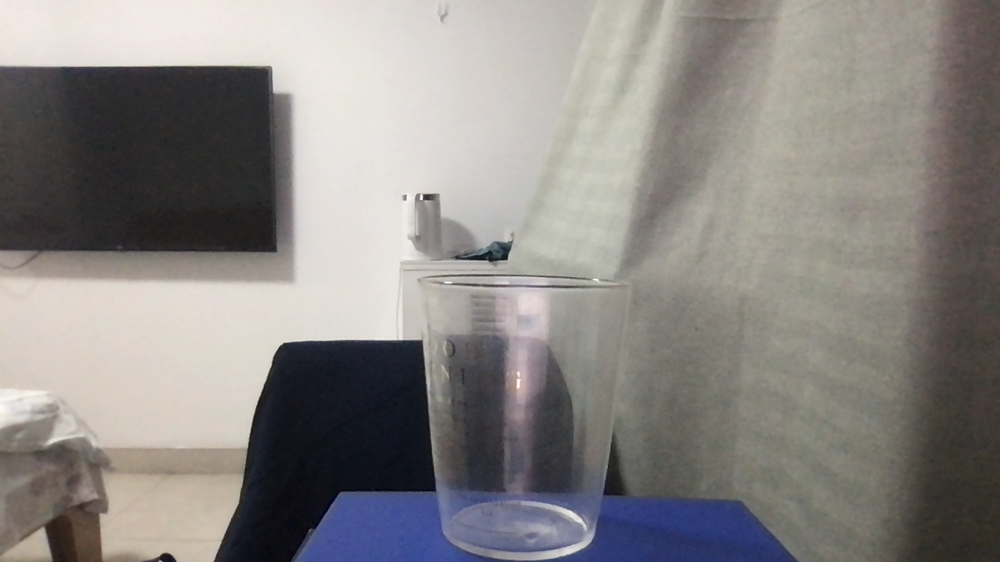

In [52]:
img_pil

In [53]:
input_img = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
pred_logits = model(input_img) # 执行前向预测，得到所有类别的 logit 预测分数
pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算

n = 5
top_n = torch.topk(pred_softmax, n) # 取置信度最大的 n 个结果
pred_ids = top_n[1].cpu().detach().numpy().squeeze() # 解析出类别
confs = top_n[0].cpu().detach().numpy().squeeze() # 解析出置信度

In [54]:
draw = ImageDraw.Draw(img_pil) 
# 在图像上写字
for i in range(len(confs)):
    pred_class = idx_to_labels[pred_ids[i]][1]
    text = '{:<15} {:>.3f}'.format(pred_class, confs[i])
    # 文字坐标，中文字符串，字体，rgba颜色
    draw.text((50, 100 + 50 * i), text, font=font, fill=(255, 0, 0, 1))
img = np.array(img_pil) # PIL 转 array

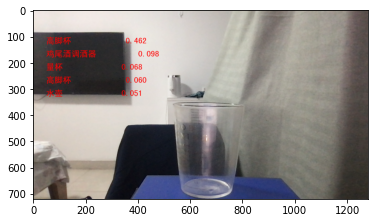

In [55]:
plt.imshow(img)
plt.show()

#### 处理单帧画面的函数

In [56]:
# 处理帧函数
def process_frame(img):
    
    # 记录该帧开始处理的时间
    start_time = time.time()
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR转RGB
    img_pil = Image.fromarray(img_rgb) # array 转 PIL
    input_img = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
    pred_logits = model(input_img) # 执行前向预测，得到所有类别的 logit 预测分数
    pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算
    
    top_n = torch.topk(pred_softmax, 5) # 取置信度最大的 n 个结果
    pred_ids = top_n[1].cpu().detach().numpy().squeeze() # 解析预测类别
    confs = top_n[0].cpu().detach().numpy().squeeze() # 解析置信度
    
    # 使用PIL绘制中文
    draw = ImageDraw.Draw(img_pil) 
    # 在图像上写字
    for i in range(len(confs)):
        pred_class = idx_to_labels[pred_ids[i]][1]
        text = '{:<15} {:>.3f}'.format(pred_class, confs[i])
        # 文字坐标，中文字符串，字体，bgra颜色
        draw.text((50, 100 + 50 * i),  text, font=font, fill=(255, 0, 0, 1))
    img = np.array(img_pil) # PIL 转 array
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) # RGB转BGR
    
    # 记录该帧处理完毕的时间
    end_time = time.time()
    # 计算每秒处理图像帧数FPS
    FPS = 1/(end_time - start_time)  
    # 图片，添加的文字，左上角坐标，字体，字体大小，颜色，线宽，线型
    img = cv2.putText(img, 'FPS  '+str(int(FPS)), (50, 80), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 255), 4, cv2.LINE_AA)
    return img

#### 调用摄像头获取每帧

In [57]:
# 调用摄像头逐帧实时处理模板
# 不需修改任何代码，只需修改process_frame函数即可
# 同济子豪兄 2021-7-8

# 导入opencv-python
import cv2
import time

# 获取摄像头，传入0表示获取系统默认摄像头
cap = cv2.VideoCapture(1)

# 打开cap
cap.open(0)

# 无限循环，直到break被触发
while cap.isOpened():
    # 获取画面
    success, frame = cap.read()
    if not success:
        print('Error')
        break
    
    ## !!!处理帧函数
    frame = process_frame(frame)
    
    # 展示处理后的三通道图像
    cv2.imshow('my_window',frame)

    if cv2.waitKey(1) in [ord('q'),27]: # 按键盘上的q或esc退出（在英文输入法下）
        break
    
# 关闭摄像头
cap.release()

# 关闭图像窗口
cv2.destroyAllWindows()